In [13]:
! pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=4a9345960df2c7cd978cdc44f0b6fb33299faceee8e4806e6f3f083ca6a00e8b
  Stored in directory: /root/.cache/pip/wheels/5f/d4/d7/4189b07b5902ee9f3ce0dbb14909fbe8037c39d6c63ffd49c9
Successfully built htmlmin
  Attempting uninstall: numpy
  

In [1]:
import pandas as pd
from ydata_profiling import ProfileReport

df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/files/binary_mushroom/train.csv')
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 22/22 [03:15<00:00,  8.90s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# CNN

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


In [2]:
df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/files/binary_mushroom/train.csv')
df.head()

,id,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,0,e,8.80,f,s,u,f,a,c,w,...,NaN,NaN,w,NaN,NaN,f,f,NaN,d,a
1,1,p,4.51,x,h,o,f,a,c,n,...,NaN,y,o,NaN,NaN,t,z,NaN,d,w
2,2,e,6.94,f,s,b,f,x,c,w,...,NaN,s,n,NaN,NaN,f,f,NaN,l,w
3,3,e,3.88,f,y,g,f,s,NaN,g,...,NaN,NaN,w,NaN,NaN,f,f,NaN,d,u
4,4,e,5.85,x,l,w,f,d,NaN,w,...,NaN,NaN,w,NaN,NaN,f,f,NaN,g,a


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3116945 entries, 0 to 3116944
Data columns (total 22 columns):
 #   Column                Dtype  
---  ------                -----  
 0   id                    int64  
 1   class                 object 
 2   cap-diameter          float64
 3   cap-shape             object 
 4   cap-surface           object 
 5   cap-color             object 
 6   does-bruise-or-bleed  object 
 7   gill-attachment       object 
 8   gill-spacing          object 
 9   gill-color            object 
 10  stem-height           float64
 11  stem-width            float64
 12  stem-root             object 
 13  stem-surface          object 
 14  stem-color            object 
 15  veil-type             object 
 16  veil-color            object 
 17  has-ring              object 
 18  ring-type             object 
 19  spore-print-color     object 
 20  habitat               object 
 21  season                object 
dtypes: float64(3), int64(1), object(18)
memory

In [8]:
df.describe()

,id,cap-diameter,stem-height,stem-width
count,3.116945e+06,3.116941e+06,3.116945e+06,3.116945e+06
mean,1.558472e+06,6.309848e+00,6.348333e+00,1.115379e+01
std,8.997847e+05,4.657931e+00,2.699755e+00,8.095477e+00
min,0.000000e+00,3.000000e-02,0.000000e+00,0.000000e+00
25%,7.792360e+05,3.320000e+00,4.670000e+00,4.970000e+00
50%,1.558472e+06,5.750000e+00,5.880000e+00,9.650000e+00
75%,2.337708e+06,8.240000e+00,7.410000e+00,1.563000e+01
max,3.116944e+06,8.067000e+01,8.872000e+01,1.029000e+02


In [3]:
cat=df.select_dtypes(include='object').columns

df[cat].apply(lambda x:x.nunique())

,0
class,2
cap-shape,74
cap-surface,83
cap-color,78
does-bruise-or-bleed,26
gill-attachment,78
gill-spacing,48
gill-color,63
stem-root,38
stem-surface,60


In [5]:
! pip install dython

In [6]:
from dython.nominal import associations

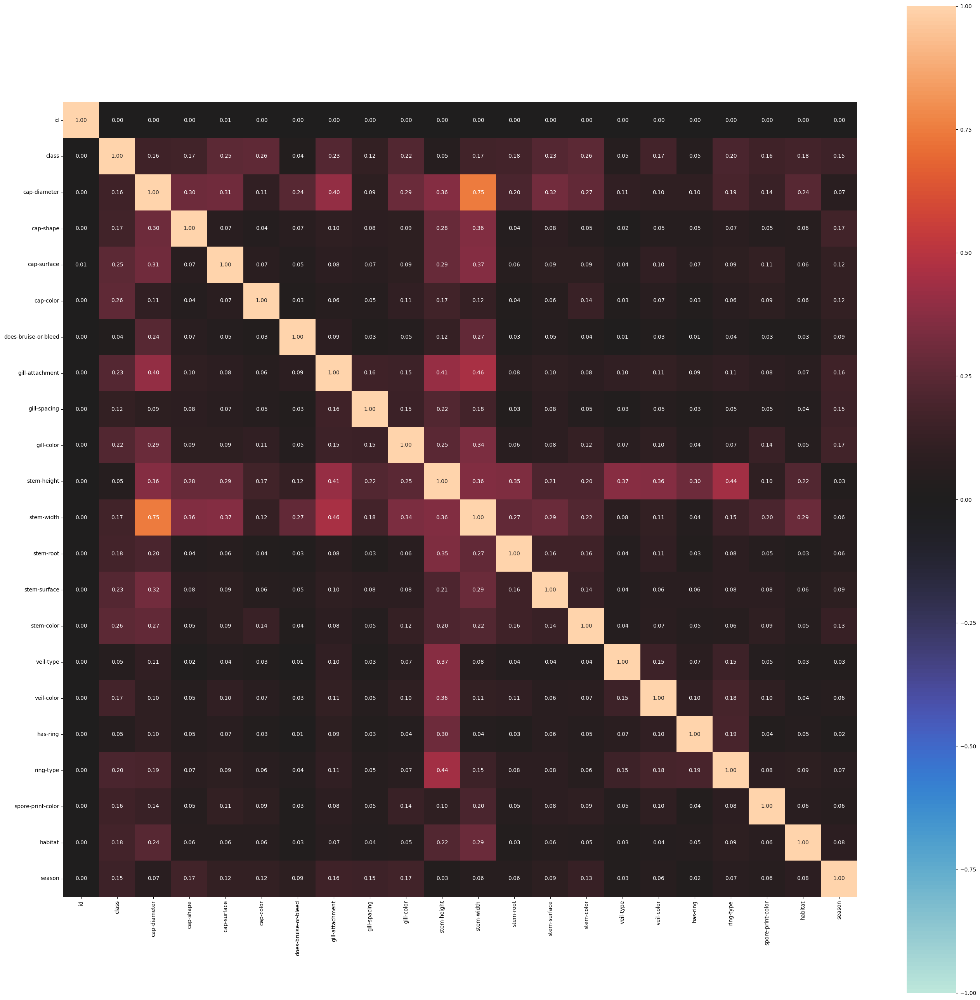

,id,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
id,1.000000,0.000136,0.000290,0.004929,0.005112,0.004820,0.003106,0.004830,0.004112,0.004420,...,0.003929,0.004161,0.004290,0.002536,0.003122,0.001828,0.003366,0.003060,0.004038,0.001443
class,0.000136,1.000000,0.162627,0.167512,0.252839,0.258534,0.037603,0.233305,0.115401,0.219998,...,0.178553,0.230450,0.257300,0.050561,0.172119,0.049680,0.202577,0.161649,0.177651,0.149205
cap-diameter,0.000290,0.162627,1.000000,0.304209,0.307973,0.108830,0.239095,0.404206,0.091825,0.289639,...,0.197717,0.318385,0.265726,0.108491,0.097321,0.099007,0.193793,0.137824,0.237370,0.065546
cap-shape,0.004929,0.167512,0.304209,1.000000,0.066625,0.042743,0.067983,0.100374,0.083568,0.092264,...,0.042989,0.079015,0.050885,0.022189,0.049293,0.048258,0.071000,0.051248,0.056723,0.167627
cap-surface,0.005112,0.252839,0.307973,0.066625,1.000000,0.070502,0.046286,0.079509,0.066728,0.090932,...,0.060175,0.087910,0.090925,0.039666,0.103412,0.066301,0.090348,0.110703,0.059327,0.115912
cap-color,0.004820,0.258534,0.108830,0.042743,0.070502,1.000000,0.032489,0.059049,0.050291,0.108994,...,0.038069,0.055355,0.136158,0.032479,0.065263,0.034734,0.063182,0.093190,0.060041,0.115220
does-bruise-or-bleed,0.003106,0.037603,0.239095,0.067983,0.046286,0.032489,1.000000,0.085064,0.031570,0.045725,...,0.027845,0.050645,0.037701,0.008212,0.033303,0.008335,0.041570,0.027503,0.029262,0.091952
gill-attachment,0.004830,0.233305,0.404206,0.100374,0.079509,0.059049,0.085064,1.000000,0.158618,0.154511,...,0.076572,0.098371,0.079894,0.102695,0.114156,0.085977,0.105777,0.078412,0.066689,0.163419
gill-spacing,0.004112,0.115401,0.091825,0.083568,0.066728,0.050291,0.031570,0.158618,1.000000,0.147143,...,0.032104,0.081669,0.045031,0.030218,0.052053,0.033770,0.047699,0.053220,0.039624,0.150281
gill-color,0.004420,0.219998,0.289639,0.092264,0.090932,0.108994,0.045725,0.154511,0.147143,1.000000,...,0.063892,0.084145,0.118664,0.066144,0.097298,0.044553,0.069277,0.137178,0.053304,0.165050


In [19]:
associations(df)['corr']

# Univariate

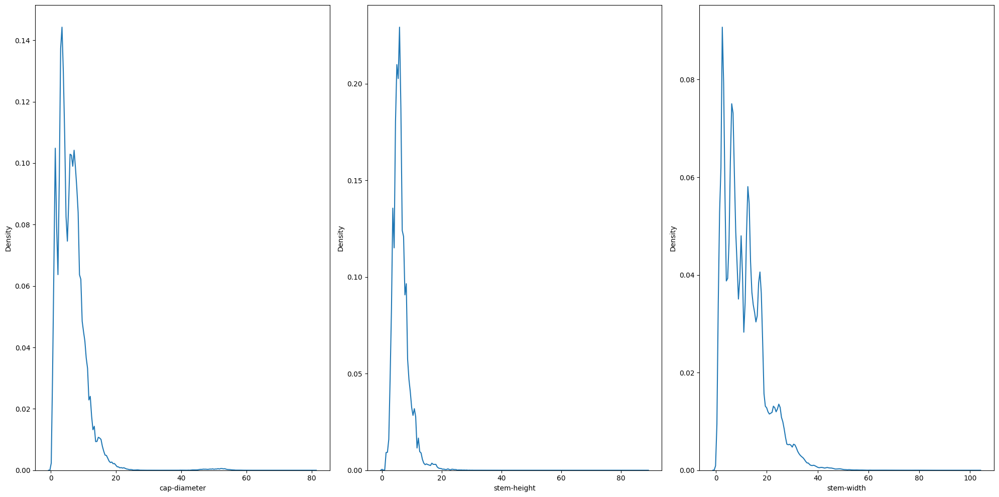

In [21]:
num = df.drop('id',axis=1).select_dtypes(include='number').columns
plt.figure(figsize=(15,10))
t=1
for i in num:
  plt.subplot(1,3,t)
  sns.kdeplot(df[i])
  t+=1
plt.tight_layout()
plt.show()

In [9]:
(df.isnull().sum()/len(df))*100

,0
id,0.000000
class,0.000000
cap-diameter,0.000128
cap-shape,0.001283
cap-surface,21.528227
cap-color,0.000385
does-bruise-or-bleed,0.000257
gill-attachment,16.809280
gill-spacing,40.373988
gill-color,0.001829


In [11]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline # Import Pipeline
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# Identify categorical columns (excluding 'id' and 'class')
categorical_cols = df.select_dtypes(include='object').columns.tolist()
if 'class' in categorical_cols:
    categorical_cols.remove('class')
# Remove columns with high null percentage as they were dropped earlier
null = (df.isnull().sum()/len(df))*100
columns_to_drop_high_null = null[null > 70].index.tolist()
categorical_cols = [col for col in categorical_cols if col not in columns_to_drop_high_null]
# Remove 'id' as it is not a feature
if 'id' in categorical_cols:
    categorical_cols.remove('id')

# Identify numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
if 'id' in numerical_cols:
    numerical_cols.remove('id')


# Create a ColumnTransformer to apply preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', SimpleImputer(strategy='mean'), numerical_cols), # Impute numerical columns
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')), # Impute categorical columns
            ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)) # Encode categorical columns
        ]), categorical_cols)
    ],
    remainder='passthrough' # Keep any other columns
)

# Need to redefine X and y based on df without the dropped columns
df_processed = df.drop(columns=columns_to_drop_high_null)
X = df_processed.drop(['class','id'], axis=1)
y = df_processed['class']

# Split data again to ensure consistent preprocessing
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=10)

# Apply the ColumnTransformer to the training and testing features
# Fit the preprocessor on the training data only
preprocessor.fit(xtrain)

# Transform both training and testing data
xtrain_processed = preprocessor.transform(xtrain)
xtest_processed = preprocessor.transform(xtest)


# Convert the processed arrays back to DataFrames for easier handling (optional, but good for inspection)
# The order of columns after transformation will be the numerical columns followed by the categorical columns
all_feature_names = numerical_cols + categorical_cols


xtrain = pd.DataFrame(xtrain_processed, columns=all_feature_names, index=xtrain.index)
xtest = pd.DataFrame(xtest_processed, columns=all_feature_names, index=xtest.index)


print("Categorical and numerical columns preprocessed using ColumnTransformer with Imputation and OrdinalEncoder.")
print("xtrain after preprocessing:")
print(xtrain.head())
print("\nxtest after preprocessing:")
print(xtest.head())

Categorical and numerical columns preprocessed using ColumnTransformer with Imputation and OrdinalEncoder.
xtrain after preprocessing:
         cap-diameter  stem-height  stem-width  cap-shape  cap-surface  \
654055           7.98         7.98       20.87       60.0         56.0   
2471972          8.49         5.30       21.93       56.0         56.0   
1110609         13.74         9.07       28.93       60.0         40.0   
1714512          5.89         6.02        6.16       60.0         40.0   
576145           1.58         5.26        2.64       43.0         59.0   

         cap-color  does-bruise-or-bleed  gill-attachment  gill-spacing  \
654055        44.0                   8.0             56.0          18.0   
2471972       62.0                  19.0             32.0          18.0   
1110609       52.0                  19.0             49.0          18.0   
1714512       52.0                   8.0             56.0          18.0   
576145        52.0                   8.0     

In [13]:
import tensorflow
from tensorflow.keras import layers,models


model= models.Sequential([
    layers.Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(xtrain.shape[1], 1)),
    layers.MaxPooling1D(pool_size=2),
    layers.Conv1D(filters=64, kernel_size=3, activation='relu'),
    layers.GlobalAveragePooling1D(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 14, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 5, 64)          │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 64)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,561 (41.25 KB)

 Trainable params: 10,561 (41.25 KB)

 Non-trainable params: 0 (0.00 B)

In [17]:
ytrain.info()

<class 'pandas.core.series.Series'>
Index: 2181861 entries, 654055 to 1048548
Series name: class
Non-Null Count    Dtype
--------------    -----
2181861 non-null  int64
dtypes: int64(1)
memory usage: 33.3 MB


In [14]:
ytrain=ytrain.map({'p':1,'e':0})
ytest=ytest.map({'p':1,'e':0})

In [15]:
history = model.fit(
    xtrain, ytrain,
    validation_data=(xtest, ytest),
    epochs=10,
    batch_size=512
)

Epoch 1/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 23s 4ms/step - accuracy: 0.7195 - loss: 0.5323 - val_accuracy: 0.9075 - val_loss: 0.2507
Epoch 2/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - accuracy: 0.9153 - loss: 0.2315 - val_accuracy: 0.8554 - val_loss: 0.3384
Epoch 3/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - accuracy: 0.9476 - loss: 0.1657 - val_accuracy: 0.9460 - val_loss: 0.1615
Epoch 4/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - accuracy: 0.9575 - loss: 0.1422 - val_accuracy: 0.9580 - val_loss: 0.1368
Epoch 5/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 17s 4ms/step - accuracy: 0.9635 - loss: 0.1264 - val_accuracy: 0.9700 - val_loss: 0.1170
Epoch 6/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - accuracy: 0.9666 - loss: 0.1178 - val_accuracy: 0.9744 - val_loss: 0.1023
Epoch 7/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - accuracy: 0.9709 - loss: 0.1069 - val_accuracy: 0.9748 - val_loss: 0.0959
Epoch 8/10
4262/4262 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - accuracy: 0.9734 - loss: 0

In [18]:
loss, acc = model.evaluate(xtest, ytest)
print(f"Test Accuracy: {acc:.4f}")

29222/29222 ━━━━━━━━━━━━━━━━━━━━ 65s 2ms/step - accuracy: 0.9748 - loss: 0.0948
Test Accuracy: 0.9749


In [19]:
ypred_test = model.predict(xtest)
ypred_train = model.predict(xtrain)
ypred_test = [1 if ypred_test[i]>0.5 else 0 for i in range(len(ypred_test))]
ypred_train = [1 if ypred_train[i]>0.5 else 0 for i in range(len(ypred_train))]
from sklearn.metrics import classification_report
print(classification_report(ytest,ypred_test))
print(classification_report(ytrain,ypred_train))

29222/29222 ━━━━━━━━━━━━━━━━━━━━ 40s 1ms/step
68184/68184 ━━━━━━━━━━━━━━━━━━━━ 90s 1ms/step
              precision    recall  f1-score   support

           0       0.98      0.96      0.97    423304
           1       0.97      0.99      0.98    511780

    accuracy                           0.97    935084
   macro avg       0.98      0.97      0.97    935084
weighted avg       0.98      0.97      0.97    935084

              precision    recall  f1-score   support

           0       0.98      0.96      0.97    988245
           1       0.97      0.99      0.98   1193616

    accuracy                           0.98   2181861
   macro avg       0.98      0.97      0.98   2181861
weighted avg       0.98      0.98      0.98   2181861



In [25]:
test=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/files/binary_mushroom/test.csv')
test.head()

,id,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,3116945,8.64,x,NaN,n,t,NaN,NaN,w,11.13,...,b,NaN,w,u,w,t,g,NaN,d,a
1,3116946,6.90,o,t,o,f,NaN,c,y,1.27,...,NaN,NaN,n,NaN,NaN,f,f,NaN,d,a
2,3116947,2.00,b,g,n,f,NaN,c,n,6.18,...,NaN,NaN,n,NaN,NaN,f,f,NaN,d,s
3,3116948,3.47,x,t,n,f,s,c,n,4.98,...,NaN,NaN,w,NaN,n,t,z,NaN,d,u
4,3116949,6.17,x,h,y,f,p,NaN,y,6.73,...,NaN,NaN,y,NaN,y,t,NaN,NaN,d,u


In [26]:
id =test['id']

In [27]:
test.drop(columns_to_drop_high_null,axis=1,inplace=True)
test_processed = preprocessor.transform(test)
test = pd.DataFrame(test_processed, columns=all_feature_names, index=test.index)

test.head()

,cap-diameter,stem-height,stem-width,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-surface,stem-color,has-ring,ring-type,habitat,season
0,8.64,11.13,17.12,60.0,56.0,52.0,19.0,29.0,18.0,51.0,39.0,40.0,16.0,16.0,20.0,0.0
1,6.90,1.27,10.75,53.0,56.0,53.0,8.0,29.0,18.0,53.0,39.0,32.0,4.0,15.0,20.0,0.0
2,2.00,6.18,3.14,38.0,39.0,52.0,8.0,29.0,18.0,39.0,39.0,32.0,4.0,15.0,20.0,1.0
3,3.47,4.98,8.51,60.0,56.0,52.0,8.0,51.0,18.0,39.0,39.0,40.0,16.0,35.0,20.0,2.0
4,6.17,6.73,13.70,60.0,40.0,64.0,8.0,49.0,18.0,53.0,39.0,42.0,16.0,15.0,20.0,2.0


In [28]:
test.shape

(2077964, 16)

In [30]:
ypred = model.predict(test)
ypred = [1 if ypred[i]>0.5 else 0 for i in range(len(ypred))]

ypred = ['p' if ypred[i]==1 else 'e' for i in range(len(ypred))]

64937/64937 ━━━━━━━━━━━━━━━━━━━━ 87s 1ms/step


In [32]:
res = pd.DataFrame({
    "id": id,
    "class": ypred
})
res.to_csv("submission.csv", index=False)